<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Explorations-:-a-dedicated-Notebook-for-text-&amp;-image-processing-study" data-toc-modified-id="Explorations-:-a-dedicated-Notebook-for-text-&amp;-image-processing-study-1">Explorations : a dedicated Notebook for text &amp; image processing study</a></span></li><li><span><a href="#1.-Compute-category-levels" data-toc-modified-id="1.-Compute-category-levels-2">1. Compute category levels</a></span></li><li><span><a href="#2.-Explore-langage-pre-processing" data-toc-modified-id="2.-Explore-langage-pre-processing-3">2. Explore langage pre-processing</a></span><ul class="toc-item"><li><span><a href="#2.1.-Text:-EDA-on-feature-'description'" data-toc-modified-id="2.1.-Text:-EDA-on-feature-'description'-3.1">2.1. Text: EDA on feature 'description'</a></span></li><li><span><a href="#2.2.-Text-processing" data-toc-modified-id="2.2.-Text-processing-3.2">2.2. Text processing</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Preparation-steps" data-toc-modified-id="Preparation-steps-3.2.0.1">Preparation steps</a></span></li><li><span><a href="#Process-text-step-1-(with-'default'-stop-words-to-catch-'custom'-stop-words)" data-toc-modified-id="Process-text-step-1-(with-'default'-stop-words-to-catch-'custom'-stop-words)-3.2.0.2">Process text step 1 (with 'default' stop words to catch 'custom' stop words)</a></span></li><li><span><a href="#Remove-stop-words-:-pre-study" data-toc-modified-id="Remove-stop-words-:-pre-study-3.2.0.3">Remove stop words : pre-study</a></span></li><li><span><a href="#Process-step-2-:-with-custom-stopwords" data-toc-modified-id="Process-step-2-:-with-custom-stopwords-3.2.0.4">Process step 2 : with custom stopwords</a></span></li><li><span><a href="#Text-processing-results" data-toc-modified-id="Text-processing-results-3.2.0.5">Text processing results</a></span></li><li><span><a href="#Saving-processed-descriptions" data-toc-modified-id="Saving-processed-descriptions-3.2.0.6">Saving processed descriptions</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#3.-Image-pre-processing" data-toc-modified-id="3.-Image-pre-processing-4">3. Image pre-processing</a></span><ul class="toc-item"><li><span><a href="#3.1.-Processors" data-toc-modified-id="3.1.-Processors-4.1">3.1. Processors</a></span><ul class="toc-item"><li><span><a href="#Color-mode" data-toc-modified-id="Color-mode-4.1.1">Color mode</a></span></li><li><span><a href="#Picture-sizes" data-toc-modified-id="Picture-sizes-4.1.2">Picture sizes</a></span></li><li><span><a href="#Resizing" data-toc-modified-id="Resizing-4.1.3">Resizing</a></span></li><li><span><a href="#Contrast-&amp;-brightness" data-toc-modified-id="Contrast-&amp;-brightness-4.1.4">Contrast &amp; brightness</a></span></li><li><span><a href="#Alternate-contrast" data-toc-modified-id="Alternate-contrast-4.1.5">Alternate contrast</a></span></li><li><span><a href="#Toward-shape-filter" data-toc-modified-id="Toward-shape-filter-4.1.6">Toward shape filter</a></span></li><li><span><a href="#Shape-processor" data-toc-modified-id="Shape-processor-4.1.7">Shape processor</a></span></li></ul></li><li><span><a href="#3.2.-Organizer-:-compute-processing-into-Categories-folders" data-toc-modified-id="3.2.-Organizer-:-compute-processing-into-Categories-folders-4.2">3.2. Organizer : compute processing into Categories folders</a></span></li><li><span><a href="#3.3.-SIFT-Anatomy" data-toc-modified-id="3.3.-SIFT-Anatomy-4.3">3.3. SIFT Anatomy</a></span><ul class="toc-item"><li><span><a href="#3.3.1.-SIFT-:-Features-extraction" data-toc-modified-id="3.3.1.-SIFT-:-Features-extraction-4.3.1">3.3.1. SIFT : Features extraction</a></span></li><li><span><a href="#3.3.2.-Feature-matching-with-SIFT" data-toc-modified-id="3.3.2.-Feature-matching-with-SIFT-4.3.2">3.3.2. Feature matching with SIFT</a></span></li></ul></li></ul></li></ul></div>

Etienne Lardeur 2020 - P6 Project Data Scientist - OpenClassrooms

# Explorations : a dedicated Notebook for text & image processing study

This Notebook has been extracted out of the master Notebook in order to separate those exploratory steps from the main study.

In [1]:
%load_ext pycodestyle_magic
%flake8_on
# PEP8 tested

In [11]:
import numpy as np
import pandas as pd
from random import randint
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import seaborn as sns
import operator
from operator import itemgetter
from collections import Counter
# get the path
import os
import os.path
# paths imutils
from imutils import paths
# opencv
import cv2
# scipy
from scipy import ndimage
from scipy.spatial import distance
# clustering
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import adjusted_rand_score
# text processing
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
import string
from string import digits
from string import punctuation
import re
# projections
from sklearn.manifold import TSNE
# decomposition
from sklearn.decomposition import NMF
from sklearn.decomposition import PCA
from sklearn.decomposition import LatentDirichletAllocation
# transformer
from sklearn.preprocessing import StandardScaler
# image
# from PIL import Image
# gensim - coherence for topic size
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
from gensim.models.nmf import Nmf

# 1. Compute category levels

In [12]:
# read csv file (products description)
data = pd.read_csv('data/flipkart_com-ecommerce_sample_1050.csv')

In [13]:
# flaten category levels
cat_levels = []
for i in range(1, 8):
    cat_levels.append('cat_lvl_'+str(i))

In [14]:
# flaten category_tree as levels cat_lvl
for index in data.index:
    depth = len(
        data.loc[
            index, 'product_category_tree'].split("\"")[1].split(" >> "))
    for i, lvl in enumerate(cat_levels):
        if i + 1 <= depth:
            data.loc[
                index, lvl] = data.loc[
                index, 'product_category_tree'].split("\"")[1].split(" >> ")[i]

In [15]:
# remove unvalid categories (pseudo level names cutted by '...')
for lvl in cat_levels:
    mask = data[lvl].str.contains(r'\.\.\.', na=False)
    data[lvl][mask] = np.nan

C:\Users\etien\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


Text(0.5, 1.02, 'Level 1 Prodcut Categories')

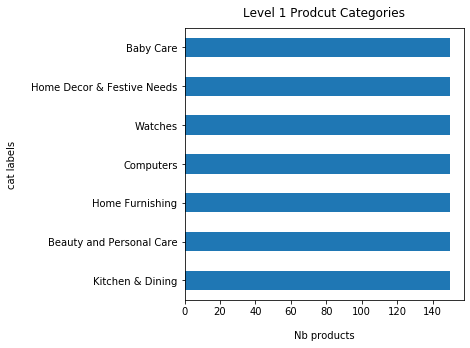

In [16]:
# observe first level
data['cat_lvl_1'].value_counts().plot(
    kind='barh',
    figsize=(5, 5)).invert_yaxis()
plt.xlabel('Nb products', labelpad=14)
plt.ylabel('cat labels', labelpad=14)
plt.title('Level 1 Prodcut Categories', y=1.02)

# 2. Explore langage pre-processing

## 2.1. Text: EDA on feature 'description' 

In [17]:
# pick a description
data['description'][85]

"Key Features of Smart Wall Guru Medium Adhesive Sticker We Showcase A Variety Of Wall Decal Categories Study room Looking Awesome Living room Bath room Attractive Guest room Kitchen Easy to Install Easy to Remove Easy To Clean All Wall Decal are front Matte Finish, water resistant & packaged between two layers.,Smart Wall Guru Medium Adhesive Sticker (Pack of 1) Price: Rs. 299 'Smart Wall Guru'' gives u a pure beautiful house with our decoration wall stickers,wall decals & all kind of designs for your home decoration.These stickers are made of self adhesive PVC vinyl and very easy to apply on plane surface. These are the great suppliment of wallpaper,wall color and another decoration method. Thnkss…,Specifications of Smart Wall Guru Medium Adhesive Sticker (Pack of 1) In The Box Number of Contents in Sales Package Pack of 1 Sales Package 1 Sticker General Ideal Use Home, Child Bedroom, Bedroom Scratch-resistant Yes Brand Smart Wall Guru Laminated Yes Type Adhesive Size in Number 58.43

In [18]:
# word counter

def word_count(text):
    return len(str(text).split(' '))

In [19]:
# Get the word count
data['word_count'] = data['description'].apply(word_count)
data['word_count'].describe()

count    1050.000000
mean       80.321905
std        77.407537
min        18.000000
25%        31.000000
50%        47.000000
75%       103.000000
max       589.000000
Name: word_count, dtype: float64

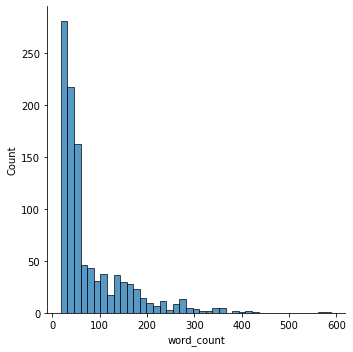

In [20]:
# Plot a hist of the word counts
sns.displot(
    x='word_count',
    data=data
)

## 2.2. Text processing

There is a bunch of various ways to pre-process text. We decide to get rid of punctuation, switch to lower case, suppress stopwords.

#### Preparation steps

In [21]:
# remove # if not already downloaded
# nltk.download('stopwords')
# nltk.download('punkt')
# nltk.download('words')

In [22]:
# List of punctuation from 'string'
punc = list(set(string.punctuation))
punc.append('°')
len(punc)

33

In [23]:
# default stop words (wider scope)
default_stopwords = set(
    ENGLISH_STOP_WORDS).union(
    set(nltk.corpus.stopwords.words('english')))
len(default_stopwords)

378

In [24]:
# english words
english_words = set(nltk.corpus.words.words())
len(english_words)

235892

#### Process text step 1 (with 'default' stop words to catch 'custom' stop words)
Switch to lower case and filter on alphabetic without punctuation and stemming.

In [25]:
# set only default
stop_words = default_stopwords

In [26]:
''' how to ensure being processed AFTER tokenization?
# lower case
descriptions = list(map(str.lower, descriptions))
# remove punctuation through regex
punctuation = re.compile(r'[_.,;\/#!?:()&-]+')
descriptions = [re.sub(punctuation, ' ', x) for x in descriptions]
# remove numeric data
numeric = re.compile(r'\d+')
descriptions = [re.sub(numeric, '', x) for x in descriptions]
'''

" how to ensure being processed AFTER tokenization?\n# lower case\ndescriptions = list(map(str.lower, descriptions))\n# remove punctuation through regex\npunctuation = re.compile(r'[_.,;\\/#!?:()&-]+')\ndescriptions = [re.sub(punctuation, ' ', x) for x in descriptions]\n# remove numeric data\nnumeric = re.compile(r'\\d+')\ndescriptions = [re.sub(numeric, '', x) for x in descriptions]\n"

In [27]:
# get ready for custom stop word identification
data['test_desc'] = data['description'].str.lower()
data['test_desc'] = data['test_desc'].str.replace(r'\d+', ' ')
data['test_desc'] = data['test_desc'].str.replace(r'\b\w{1,2}\b', '')
data['test_desc'] = data['test_desc'].str.replace(r"[°_.,;*\/#!?:&-']+", ' ')
data['test_desc'] = data['test_desc'].str.replace(r'[()]', '')
data['test_desc'] = data['test_desc'].str.replace(r"['']", '')
data['test_desc'] = data['test_desc'].str.replace(r"[...]", '')
data['test_desc'] = data['test_desc'].str.replace(r"[@]", '')
data['test_desc'] = data['test_desc'].str.replace(r"[%]", '')
data['test_desc'] = data['test_desc'].str.replace(r"[-]", '')

In [28]:
# function
def processor(text):
    text = text.str.lower()
    text = text.str.replace(r'\d+', ' ')
    text = text.str.replace(r'\b\w{1,2}\b', '')
    text = text.str.replace(r"[°_.,;*\/#!?:&-']+", ' ')
    text = text.str.replace(r'[()]', '')
    text = text.str.replace(r"['']", '')
    text = text.str.replace(r"[...]", '')
    text = text.str.replace(r"[@]", '')
    text = text.str.replace(r"[%]", '')
    text = text.str.replace(r"[-]", '')
    return text

In [29]:
'''
def process_text(text):
    text = nltk.word_tokenize(text)
    text = [each.lower() for each in text]
    text = [re.sub('[0-9]+', '', each) for each in text]
    text = [re.sub(
    text = [SnowballStemmer('english').stem(each) for each in text]
    text = [w for w in text if w not in punc]
    text = [w for w in text if w not in stop_words]
    text = [each for each in text if len(each) > 3]
    text = [each for each in text if ' ' not in each]
    return text
    '''

"\ndef process_text(text):\n    text = nltk.word_tokenize(text)\n    text = [each.lower() for each in text]\n    text = [re.sub('[0-9]+', '', each) for each in text]\n    text = [re.sub(\n    text = [SnowballStemmer('english').stem(each) for each in text]\n    text = [w for w in text if w not in punc]\n    text = [w for w in text if w not in stop_words]\n    text = [each for each in text if len(each) > 3]\n    text = [each for each in text if ' ' not in each]\n    return text\n    "

In [30]:
# check the word count
data['p_word_count'] = data['test_desc'].apply(word_count)
data['p_word_count'].describe()

count    1050.000000
mean       97.757143
std        89.894298
min        20.000000
25%        41.000000
50%        61.000000
75%       122.750000
max       656.000000
Name: p_word_count, dtype: float64

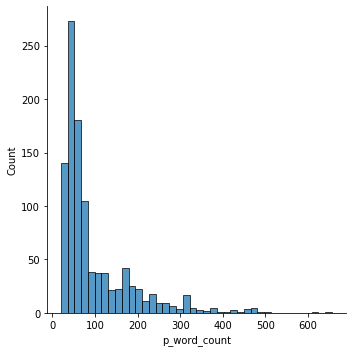

In [31]:
# Plot a hist of the word counts
sns.displot(
    x='p_word_count',
    data=data
)

#### Remove stop words : pre-study

In [32]:
# too used & too rare words
df_count = (data['test_desc'].str.split(expand=True)
            .stack()
            .value_counts()
            .rename_axis('vals')
            .reset_index(name='count'))

In [33]:
# too used
df_count[df_count['count'] > 300]

,vals,count
0,for,1447
1,the,1367
2,and,1332
3,only,890
4,with,843
5,your,656
6,products,631
7,free,614
8,buy,581
9,delivery,567


In [34]:
# too rare
df_count[df_count['count'] < 3]

,vals,count
2402,melange,2
2403,zingalalaa,2
2404,links,2
2405,lxb,2
2406,understanding,2
...,...,...
5109,dosa,1
5110,click,1
5111,sunblock,1
5112,fairies,1


In [35]:
# create exclusions
too_used = set(df_count['vals'].head(25).tolist())
df_rare = df_count[df_count['count'] < 3]
too_rare = set(df_rare['vals'].tolist())

In [36]:
# additionnal "non english" to drop
every_words = set(df_count['vals'].tolist())
drop_words = every_words.difference(english_words)
len(drop_words)

2103

In [37]:
# unify custom stop words
custom_stopwords = too_used
custom_stopwords = custom_stopwords.union(too_rare)
custom_stopwords = custom_stopwords.union(drop_words)
len(custom_stopwords)

3529

#### Process step 2 : with custom stopwords

In [38]:
# set default + custom
stop_words = default_stopwords.union(custom_stopwords)
len(stop_words)

3861

In [39]:
def process_text(text):
    text = nltk.word_tokenize(text)
    text = [each.lower() for each in text]
    text = [re.sub('\d+', '', each) for each in text]
    text = [re.sub('\b\w{1,3}\b', '', each) for each in text]
    text = [re.sub("[°_.,;*\/#!?:&-']+", '', each) for each in text]
    text = [re.sub("['']", '', each) for each in text]
    text = [re.sub(r"[@]", '', each) for each in text]
    text = [re.sub(r"[%]", '', each) for each in text]
    text = [re.sub(r"[-]", '', each) for each in text]
    text = [w for w in text if w not in punc]
    text = [w for w in text if w not in stop_words]
    text = [SnowballStemmer('english').stem(each) for each in text]
    text = [each for each in text if ' ' not in each]
    return text

In [40]:
# apply processor
data['processed_description'] = data['description'].apply(process_text)
# Get the final word count
data['p_word_count'] = data['processed_description'].apply(word_count)
data['p_word_count'].describe()

count    1050.000000
mean       47.015238
std        46.083211
min         8.000000
25%        16.000000
50%        26.000000
75%        65.000000
max       314.000000
Name: p_word_count, dtype: float64

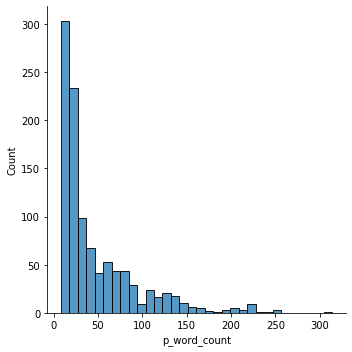

In [41]:
# Plot a hist of the word counts
sns.displot(
    x='p_word_count',
    data=data
)

#### Text processing results

In [42]:
# pick a processed description
data['processed_description'][85]

['key',
 'smart',
 'wall',
 'guru',
 'medium',
 'adhes',
 'sticker',
 'varieti',
 'wall',
 'decal',
 'studi',
 'room',
 'look',
 'awesom',
 'live',
 'room',
 'bath',
 'room',
 'attract',
 'guest',
 'room',
 'kitchen',
 'easi',
 'instal',
 'easi',
 'remov',
 'easi',
 'clean',
 'wall',
 'decal',
 'matt',
 'finish',
 '',
 'water',
 'resist',
 '',
 '',
 'smart',
 'wall',
 'guru',
 'medium',
 'adhes',
 'sticker',
 'pack',
 '',
 '',
 'rs',
 '',
 '',
 'smart',
 'wall',
 'guru',
 '',
 'u',
 'pure',
 'beauti',
 'hous',
 'decor',
 'wall',
 'sticker',
 '',
 'wall',
 '',
 'kind',
 'home',
 'decorationthes',
 'sticker',
 'self',
 'adhes',
 'vinyl',
 'easi',
 'appli',
 'plane',
 'surfac',
 '',
 'great',
 'wallpap',
 '',
 'wall',
 'color',
 'decor',
 'method',
 '',
 '',
 'smart',
 'wall',
 'guru',
 'medium',
 'adhes',
 'sticker',
 'pack',
 '',
 'box',
 'number',
 'content',
 'packag',
 'pack',
 '',
 'packag',
 '',
 'sticker',
 'general',
 'ideal',
 'use',
 'home',
 '',
 'child',
 'bedroom',
 '',
 'be

In [43]:
# observe processing result
corpus_sample = ' '.join(data['processed_description'][85])
corpus_sample

'key smart wall guru medium adhes sticker varieti wall decal studi room look awesom live room bath room attract guest room kitchen easi instal easi remov easi clean wall decal matt finish  water resist   smart wall guru medium adhes sticker pack   rs   smart wall guru  u pure beauti hous decor wall sticker  wall  kind home decorationthes sticker self adhes vinyl easi appli plane surfac  great wallpap  wall color decor method   smart wall guru medium adhes sticker pack  box number content packag pack  packag  sticker general ideal use home  child bedroom  bedroom yes brand smart wall guru lamin yes type adhes size number  cm number sticker  materi self adhes vinyl size medium height  cm width  cm'

#### Saving processed descriptions

In [45]:
# store processed descriptions for futher use
data.to_csv('Data/txt_processed_data.csv', index=False)

# 3. Image pre-processing

Warning : the global rendering of any processor tested below on samples pitcures does not ensure improvement of results. <br/>
Thoses experimentations shall be considedered as a way to understand the wide range of available processors. <br/>
Therefore, computer vision enhancement through processing will be assessed along the entire optimization process. <br/>
We had to catch the basics and explore qualitatively how a model build descriptors out of a picture depending its process.

## 3.1. Processors

### Color mode

In [203]:
# build image file path from data['image']
img_name = data['image'][85]
img_path = os.path.join('Data/Images', img_name)

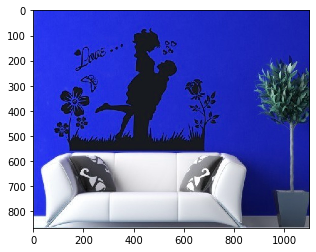

In [204]:
# read and show
img = cv2.imread(img_path)
plt.imshow(img)

Pictures are stored in BGR mode.

In [88]:
# Return a processed img, and display Before - After
# set adequate cmap if required
# set img convert to False to skip color conversions


def img_before_after(img_path,
                     processor,
                     cmap_renderer='gray',
                     convert=True):
    before = cv2.imread(img_path)
    if convert is True:
        before = cv2.cvtColor(before, cv2.COLOR_BGR2RGB)
    else:
        None
    after = processor(img_path)
    if convert is True:
        after = cv2.cvtColor(after, cv2.COLOR_BGR2RGB)
    else:
        None
    figure, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(before)
    ax[0].title.set_text('before')
    ax[1].imshow(after, cmap=cmap_renderer)
    ax[1].title.set_text('after')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    plt.show()
    return(after)

### Picture sizes

In [206]:
print(img.shape)

(866, 1100, 3)


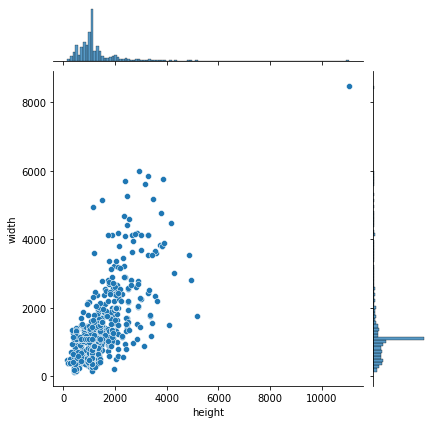

In [207]:
# observe image sizes
size = []
# get any h, w
for ind in data.index:
    img = cv2.imread(
        os.path.join(
            'Data/Images',
            data['image'].loc[ind]))
    size.append([img.shape[0], img.shape[1]])
# build dataframe
sizes = pd.DataFrame(size)
sizes.columns = ['height', 'width']
# overview of image sizes
sns.jointplot(
    x=sizes['height'],
    y=sizes['width'],
    data=sizes)

### Resizing
Below is a processor that scales an image to a given squared size.
As a first step, this seems useless for SIFT due to its scaled-invariance, but that may be usefull to deal with "normalized" files and for any other features extractor.

In [52]:
# resize image without distorsion with openCV, thx to stackoverflow J
# set size before execution

def squared_resize_keep_ratio(img_path,
                              size=500,
                              interpolation=cv2.INTER_AREA):
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    c = None if len(img.shape) < 3 else img.shape[2]
    if h == w:
        return cv2.resize(img, (size, size), interpolation)
    if h > w:
        dif = h
    else:
        dif = w
    x_pos = int((dif - w)/2.)
    y_pos = int((dif - h)/2.)
    if c is None:
        # comment original mask : black
        # mask = np.zeros((dif, dif), dtype=img.dtype)
        # new mask : white
        mask = np.full((dif, dif), fill_value=255, dtype=img.dtype)
        mask[y_pos:y_pos+h, x_pos:x_pos+w] = img[:h, :w]
    else:
        # comment original mask : black
        # mask = np.zeros((dif, dif, c), dtype=img.dtype)
        # new mask : white
        mask = np.full((dif, dif, c), fill_value=255, dtype=img.dtype)
        mask[y_pos:y_pos+h, x_pos:x_pos+w, :] = img[:h, :w, :]
    return cv2.resize(mask, (size, size), interpolation)

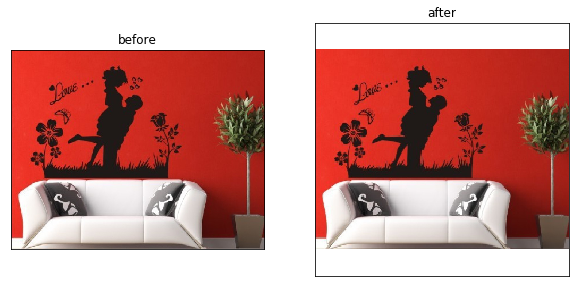

In [89]:
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
scaled_img = img_before_after(img_path, squared_resize_keep_ratio)

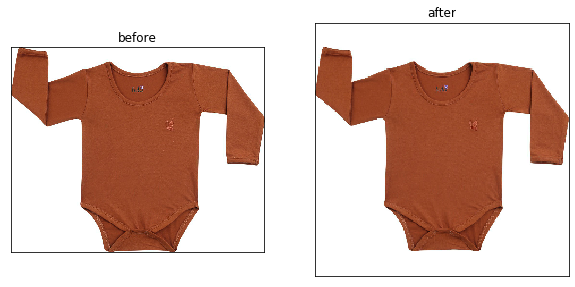

In [90]:
img_path = 'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg'
img_x = img_before_after(img_path, squared_resize_keep_ratio, convert=False)

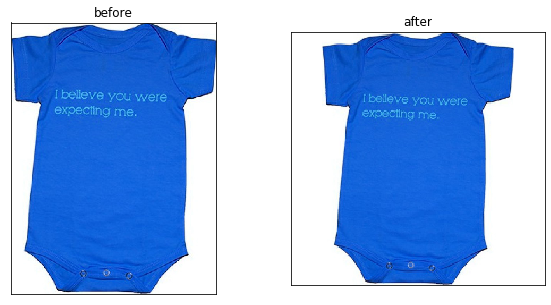

In [91]:
img_path = 'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg'
img_y = img_before_after(img_path, squared_resize_keep_ratio, convert=False)

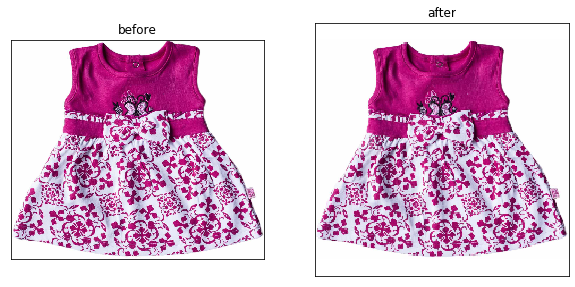

In [92]:
img_path = 'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg'
img_z = img_before_after(img_path, squared_resize_keep_ratio)

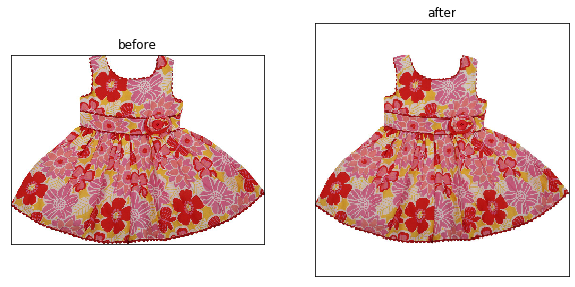

In [93]:
img_path = 'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg'
img_t = img_before_after(img_path, squared_resize_keep_ratio)

### Contrast & brightness

In [53]:
def convertScale(img, alpha, beta):
    '''Add bias and gain to an image with saturation arithmetics. Unlike
    cv2.convertScaleAbs, it does not take an absolute value,
    which would lead to nonsensical results (e.g., a pixel at 44 with
    alpha = 3 and beta = -210
    becomes 78 with OpenCV, when in fact it should become 0).
    '''

    new_img = img * alpha + beta
    new_img[new_img < 0] = 0
    new_img[new_img > 255] = 255
    return new_img.astype(np.uint8)

In [54]:
# Automatic brightness and contrast optimization
# with optional histogram clipping
# https://stackoverflow.com/questions/57030125/

def automatic_brightness_and_contrast(img_path,
                                      clip_hist_percent=25):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],
                        [0],
                        None,
                        [256],
                        [0, 256])
    hist_size = len(hist)

    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index - 1] + float(hist[index]))

    # Locate points to clip
    maximum = accumulator[- 1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0

    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1

    # Locate right cut
    maximum_gray = hist_size - 1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1

    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha

    '''
    new_hist = cv2.calcHist([gray],
                            [0],
                            None,
                            [256],
                            [minimum_gray, maximum_gray])
    plt.plot(hist)
    plt.plot(new_hist)
    plt.xlim([0, 256])
    plt.show()
    '''
    auto_result = convertScale(img, alpha=alpha, beta=beta)
    return auto_result


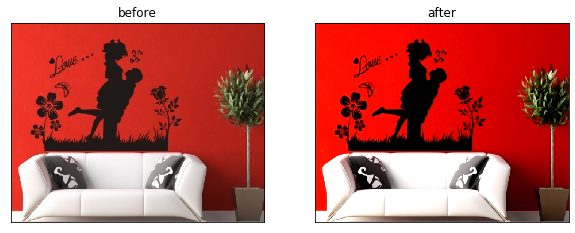

In [55]:
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
auto_img = img_before_after(img_path, automatic_brightness_and_contrast)

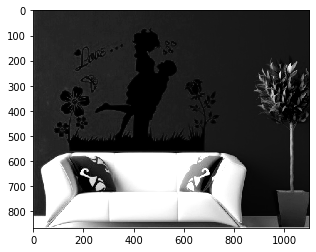

In [56]:
# what if turned into grayscale
gray_result = cv2.cvtColor(auto_img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_result, cmap="gray", vmin=0, vmax=255)

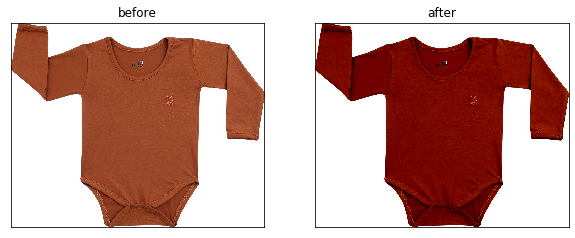

In [176]:
img_path = 'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg'
img_1a = img_before_after(img_path, automatic_brightness_and_contrast, convert=False)

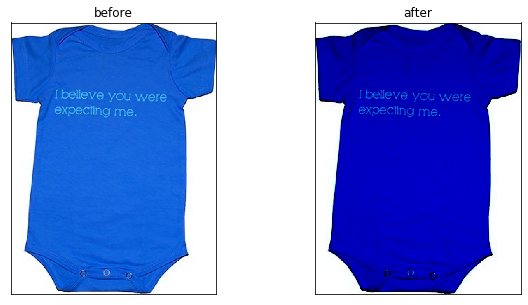

In [177]:
img_path = 'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg'
img_2a = img_before_after(img_path, automatic_brightness_and_contrast, convert=False)

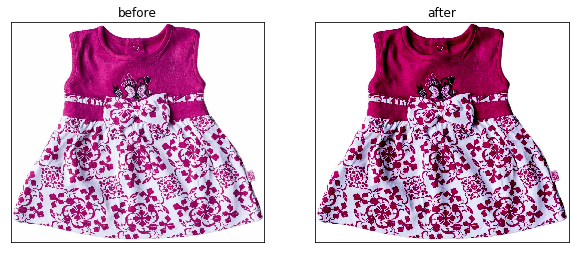

In [180]:
img_path = 'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg'
img_3a = img_before_after(img_path, automatic_brightness_and_contrast)

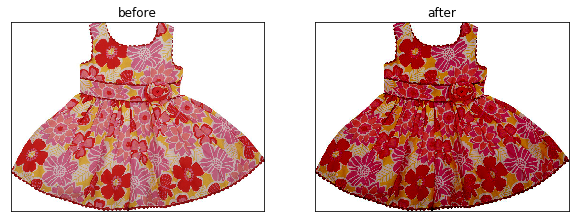

In [181]:
img_path = 'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg'
img_4a = img_before_after(img_path, automatic_brightness_and_contrast)

### Alternate contrast

In [113]:
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)

In [114]:
# Reading the image
img = cv2.imread(img_path)

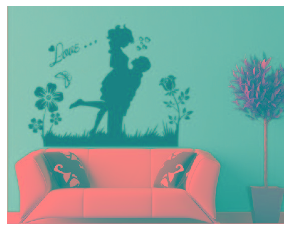

In [115]:
# Converting image to LAB Color model
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
plt.axis('off')
plt.imshow(lab)

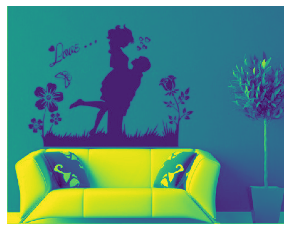

In [116]:
# Splitting the LAB image to different channels
l, a, b = cv2.split(lab)
plt.axis('off')
plt.imshow(l)

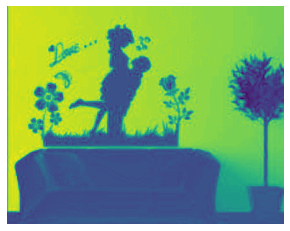

In [117]:
# Splitting the LAB image to different channels
plt.axis('off')
plt.imshow(a)

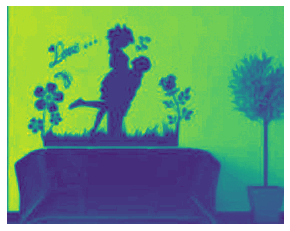

In [118]:
# Splitting the LAB image to different channels
plt.axis('off')
plt.imshow(b)

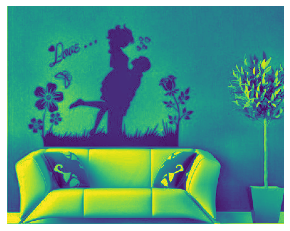

In [119]:
# Applying CLAHE to L-channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
cl = clahe.apply(l)
plt.axis('off')
plt.imshow(cl)

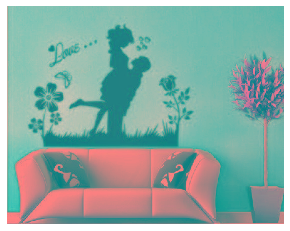

In [120]:
# Merge the CLAHE enhanced L-channel with the a and b channel
limg = cv2.merge((cl, a, b))
plt.axis('off')
plt.imshow(limg)

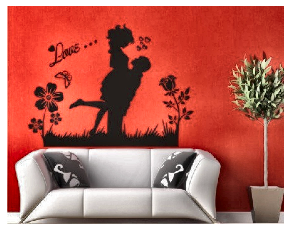

In [208]:
# Converting image from LAB Color model to RGB model
final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
plt.axis('off')
plt.imshow(final)

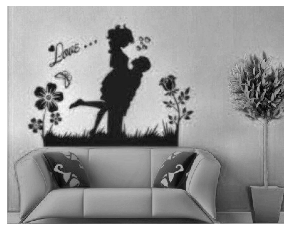

In [225]:
gray = cv2.cvtColor(limg, cv2.COLOR_RGB2GRAY)
plt.axis('off')
plt.imshow(gray, cmap='gray')

In [55]:
def contrast_processor(img_path, gray_convert=True):
    # Reading the image
    img = cv2.imread(img_path)
    # Converting image to LAB Color model
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    # Splitting the LAB image to different channels
    l, a, b = cv2.split(lab)
    # Applying CLAHE to L-channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    # Merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl, a, b))
    # Converting image from LAB Color model to RGB model
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    gray = cv2.cvtColor(final, cv2.COLOR_RGB2GRAY)
    return gray

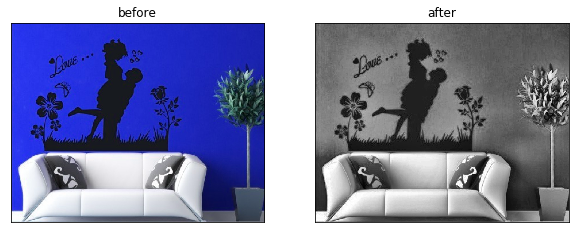

In [112]:
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
contrast_img = img_before_after(img_path, contrast_processor, cmap_renderer='gray', convert=False)

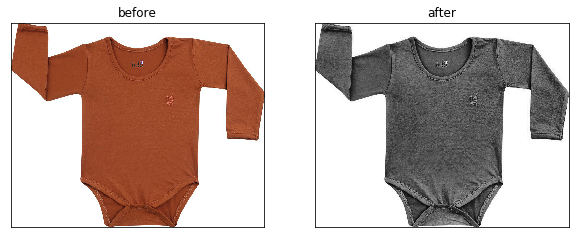

In [113]:
img_path = 'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg'
img_1 = img_before_after(img_path, contrast_processor, convert=False)

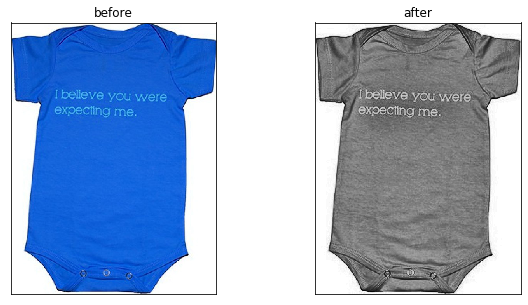

In [114]:
img_path = 'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg'
img_2 = img_before_after(img_path, contrast_processor, convert=False)

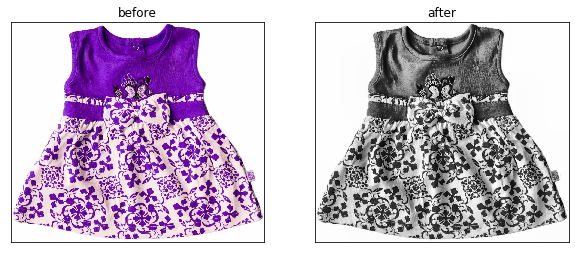

In [117]:
img_path = 'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg'
img_3 = img_before_after(img_path, contrast_processor, convert=False)

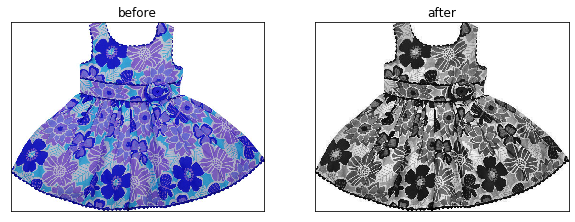

In [118]:
img_path = 'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg'
img_4 = img_before_after(img_path, contrast_processor, convert=False)

### Toward shape filter

Through edges with canny filter

In [120]:
def edges_img(img_path):
    # Reading the image
    img = cv2.imread(img_path)
    # compute from flurred img
    blurred_img = cv2.blur(img, ksize=(10, 10))
    med_val = np.median(blurred_img)
    lower = int(max(0, 0.7*med_val))
    upper = int(min(255, 1.3*med_val))
    # egdes
    edges = cv2.Canny(image=img, threshold1=lower, threshold2=upper)
    return edges

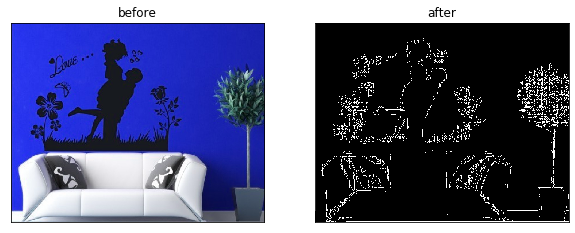

In [122]:
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
edges = img_before_after(img_path, edges_img, convert=False)

Through binarization

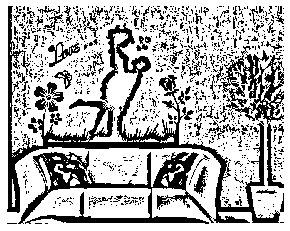

In [123]:
# from grayscaled contrast_img
binarized = cv2.adaptiveThreshold(contrast_img,
                                  255,
                                  cv2.ADAPTIVE_THRESH_MEAN_C,
                                  cv2.THRESH_BINARY,
                                  41,
                                  3)
plt.axis('off')
plt.imshow(binarized, cmap='gray')

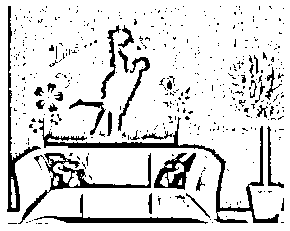

In [124]:
# from binarized : dilate
kernel = np.ones((5, 5), np.uint8)
dilated = cv2.dilate(binarized, kernel, iterations=1)
plt.axis('off')
plt.imshow(dilated, cmap='gray')

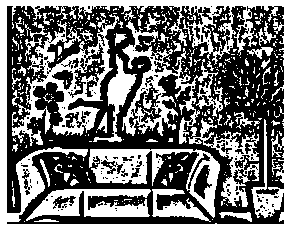

In [125]:
# from binarized : erode
kernel = np.ones((5, 5), np.uint8)
eroded = cv2.erode(binarized, kernel, iterations=1)
plt.axis('off')
plt.imshow(eroded, cmap='gray')

### Shape processor

We keep dilate with 1 iteration.

In [126]:
def shape_processor(img_path):
    # Reading the image
    img = cv2.imread(img_path)
    # Converting image to LAB Color model
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    # Splitting the LAB image to different channels
    l, a, b = cv2.split(lab)
    # Applying CLAHE to L-channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    # Merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl, a, b))
    # Converting image from LAB Color model to RGB model
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    # convert to gray
    gray_final = cv2.cvtColor(final, cv2.COLOR_RGB2GRAY)
    # autobinarize
    binarized = cv2.adaptiveThreshold(gray_final,
                                      255,
                                      cv2.ADAPTIVE_THRESH_MEAN_C,
                                      cv2.THRESH_BINARY,
                                      41,
                                      3)
    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(binarized, kernel, iterations=1)
    return dilated

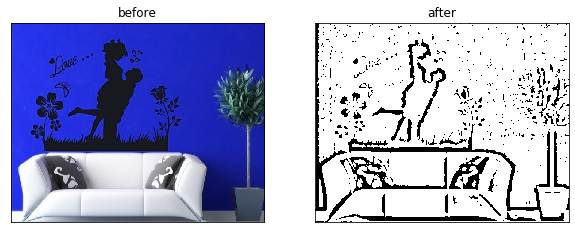

In [129]:
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
auto_img = img_before_after(img_path, shape_processor, convert=False)

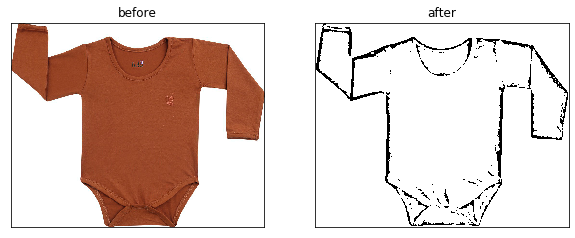

In [132]:
img_path = 'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg'
img_A = img_before_after(img_path, shape_processor, convert=False)

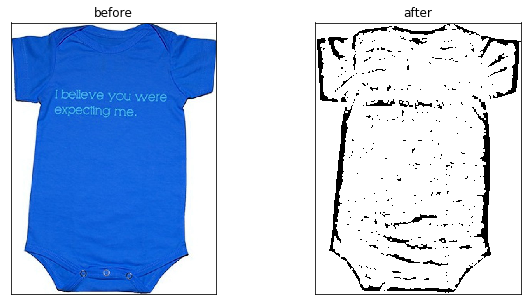

In [133]:
img_path = 'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg'
img_B = img_before_after(img_path, shape_processor, convert=False)

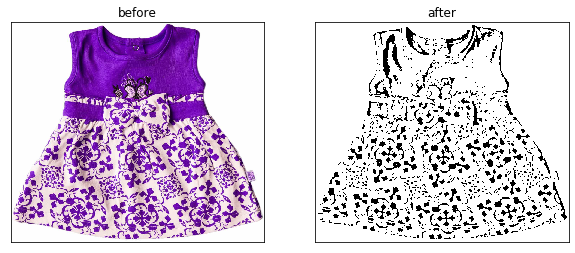

In [137]:
img_path = 'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg'
img_C = img_before_after(img_path, shape_processor, convert=False)

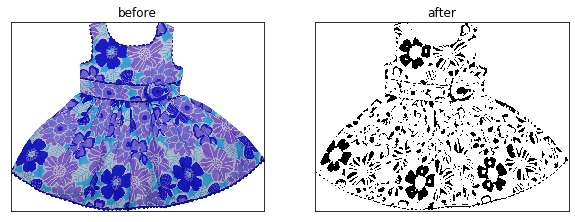

In [138]:
img_path = 'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg'
img_D = img_before_after(img_path, shape_processor, convert=False)

## 3.2. Organizer : compute processing into Categories folders

In [318]:
def organize_2_cat_folders(processor, input_path, output_path, dataset=data):
    for index, row in dataset.iterrows():
        # get url of the product's image
        img_name = row['image']
        # create the path to the image file
        img_path = os.path.join(input_path, img_name)
        # result of the processor
        img_result = processor(img_path)
        # save the preprocessed image
        if not os.path.exists(os.path.join(output_path, row['cat_lvl_1'])):
            os.makedirs(os.path.join(output_path, row['cat_lvl_1']))
        img_result_path = output_path + '/' + str(row['cat_lvl_1']) + '/' + str(row['image'])
        # print(img_result_path)
        cv2.imwrite(img_result_path, img_result)

13:80: E501 line too long (93 > 79 characters)


In [46]:
def mass_process(processor, input_path, output_path, dataset=data):
    for index, row in dataset.iterrows():
        # get url of the product's image
        img_name = row['image']
        # create the path to the image file
        img_path = os.path.join(input_path, img_name)
        # result of the processor
        img_result = processor(img_path)
        # save the preprocessed image
        img_result_path = output_path + '/' + str(row['image'])
        # print(img_result_path)
        cv2.imwrite(img_result_path, img_result)

In [ ]:
'''
# input and ouput path
input_path = 'Data/Images'
output_path = 'Data/Auto_Images'
# apply auto contrast and brigthness
organize_2_cat_folders(automatic_brightness_and_contrast, input_path, output_path, dataset=data)
'''

In [ ]:
'''
# input and ouput path
input_path = 'Data/Images'
output_path = 'Data/Shape_Images'
# apply shape method
organize_2_cat_folders(shape_processor, input_path, output_path, dataset=data)
'''

In [319]:
'''
# input and ouput path
input_path = 'Data/Images'
output_path = 'Data/Constrast_Images'
# apply alternate contrast method
organize_2_cat_folders(contrast_processor, input_path, output_path, dataset=data)
'''

In [ ]:
'''
# input and ouput path
input_path = 'Data/Images'
output_path = 'Data/Contrast_Images'
# apply alternate contrast method
organize_2_cat_folders(contrast_processor, input_path, output_path, dataset=data)
'''

In [344]:
'''
# resizing (224x224)
# input and ouput path
input_path = 'Data/Images'
output_path = 'Data/Resized_Images'
# apply resizing
mass_process(squared_resize_keep_ratio, input_path, output_path, dataset=data)
'''

In [53]:
# resizing as first step to prevent memory errors (500x500)
# input and ouput path
input_path = 'Data/Images'
output_path = 'Data/Smaller_Images'
# apply mass resizing
mass_process(squared_resize_keep_ratio, input_path, output_path, dataset=data)

In [58]:
# enhanced contrast
# input and ouput path
input_path = 'Data/Smaller_Images'
output_path = 'Data/MContrast_Images'
# apply mass resizing
mass_process(contrast_processor, input_path, output_path, dataset=data)

## 3.3. SIFT Anatomy

To figure out the anatomy of SITF method : http://weitz.de/sift/ <br/>
Despite much more efficient techniques are now available to deal with images, we decide here to go on with SIFT in order to discuss the concept of features extraction and how preprocessing matters to improve results.<br/>
This explain why we emphasize the notion of matching.<br/>
Furthermore, while Scale-Invariance is core of the algorithm structure, we'll try to apply SIFT on same sized pictures, mainly in order to try to deal equaly with details and prevent tiny details to be kept as valuable descriptors. <br/>
The "nb key-points limiation" parameter will be explored accordingly. <br/>

### 3.3.1. SIFT : Features extraction

In [149]:
# sift features extractor
sift = cv2.xfeatures2d.SIFT_create()

In [150]:
# extract features @path
def extract_features(img_path, model):

    # load image and convert it to grayscale
    # img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # load image
    img = cv2.imread(img_path)
    # detect key points and descriptors
    keypoints, descriptors = model.detectAndCompute(img, None)

    # returns keypoints and descriptors
    return keypoints, descriptors

In [151]:
# keypoints & descriptors of the sample image
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
img = cv2.imread(img_path, cv2.COLOR_BGR2GRAY)
img_keypoints, img_descriptors = extract_features(img_path, sift)

Text(0.5, 1.0, 'SIFT descriptors')

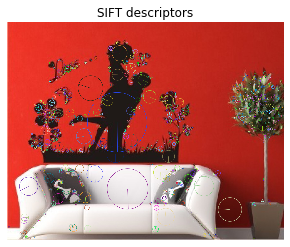

In [152]:
# paste to image and sho picture with descriptors
img_sift = cv2.drawKeypoints(image=img,
                             keypoints=img_keypoints,
                             outImage=None,
                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_sift = cv2.cvtColor(img_sift, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(img_sift)
plt.title("SIFT descriptors")

In [153]:
# get size of descriptors
img_descriptors.shape

(1453, 128)

Number of features is default 128 for SIFT and the number of descriptors depends on the input or can be set manually.

In [154]:
# With 50 descriptors
sift_50 = cv2.xfeatures2d.SIFT_create(nfeatures=50)

In [155]:
# keypoints & descriptors of the sample image
img_name = data['image'].loc[85]
img_path = os.path.join('Data/Images', img_name)
img = cv2.imread(img_path, cv2.COLOR_BGR2GRAY)
img_keypoints_50, img_descriptors_50 = extract_features(img_path, sift_50)

Text(0.5, 1.0, 'SIFT descriptors')

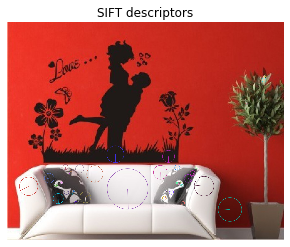

5:80: E501 line too long (81 > 79 characters)


In [156]:
# paste to image
img_sift_50 = cv2.drawKeypoints(image=img,
                                keypoints=img_keypoints_50,
                                outImage=None,
                                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_sift_50 = cv2.cvtColor(img_sift_50, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(img_sift_50)
plt.title("SIFT descriptors")

In [157]:
# get size of descriptors
img_descriptors_50.shape

(50, 128)

Gray- scale images rather than color images are generally used to get SIFT descriptors in order to reduce the complexity. The regions which have a similar grayscale level but different hues tend to produce wrong matching results in this case.

### 3.3.2. Feature matching with SIFT

Based on the assumption that a better matching would enhance classification, we explore the concept of feature matching. <br/>
We get to the conclusion that an high number of descriptors does not ensure that they'll be relevant to deal with when trying to cluster/classify. <br/>

In [185]:
def assess_sift_matching(img1, img2):
    # sift
    sift = cv2.xfeatures2d.SIFT_create()

    keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

    # feature matching
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(descriptors_1, descriptors_2)
    matches = sorted(matches, key=lambda x: x.distance)

    img1_sift = cv2.drawKeypoints(image=img1,
                                  keypoints=keypoints_1,
                                  outImage=None,
                                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    img2_sift = cv2.drawKeypoints(image=img2,
                                  keypoints=keypoints_2,
                                  outImage=None,
                                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    img3 = cv2.drawMatches(img1,
                           keypoints_1,
                           img2,
                           keypoints_2,
                           matches[:50],
                           img2,
                           flags=2)

    gs = gridspec.GridSpec(2, 2)
    fig = plt.figure(figsize=(10, 10))
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(img1_sift)
    ax1.title.set_text('img1 keypoints')
    ax1.axis('off')
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(img2_sift)
    ax2.title.set_text('img2 keypoints')
    ax2.axis('off')
    ax3 = fig.add_subplot(gs[1, :])
    ax3.imshow(img3)
    ax3.title.set_text('matching')
    ax3.axis('off')
    plt.show()

    print('number of keypoints left image : %d' % len(keypoints_1))
    print('number of keypoints right image : %d' % len(keypoints_2))
    print('total number of matches : %d ' % len(matches))

17:80: E501 line too long (83 > 79 characters)
22:80: E501 line too long (83 > 79 characters)


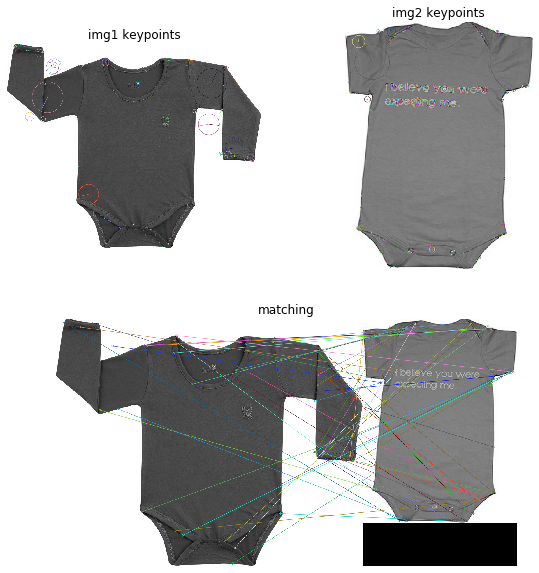

number of keypoints left image : 218
number of keypoints right image : 510
total number of matches : 122 


In [140]:
# read two images
img1 = cv2.imread(
    'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg')
img2 = cv2.imread(
    'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

assess_sift_matching(img1, img2)

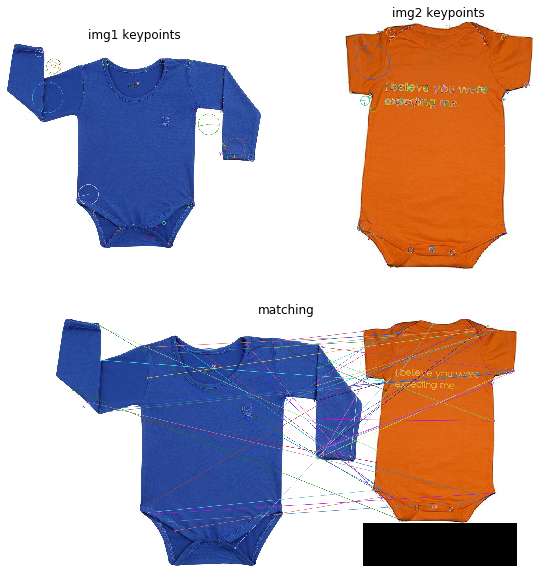

number of keypoints left image : 262
number of keypoints right image : 506
total number of matches : 128 


In [303]:
# read two images
img1 = cv2.imread(
    'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg')
img2 = cv2.imread(
    'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

assess_sift_matching(img1, img2)

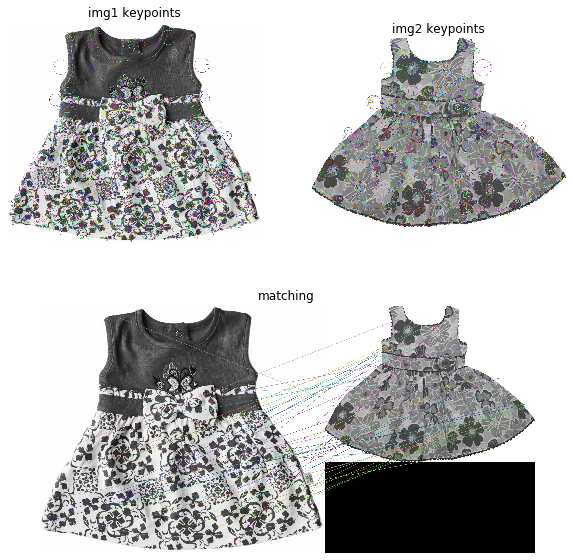

number of keypoints left image : 12931
number of keypoints right image : 5700
total number of matches : 3167 


In [306]:
# read two images
img1 = cv2.imread(
    'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg')
img2 = cv2.imread(
    'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

assess_sift_matching(img1, img2)

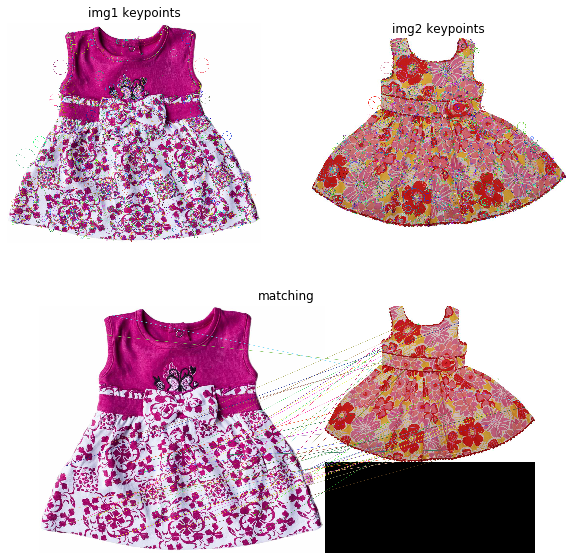

number of keypoints left image : 11988
number of keypoints right image : 7930
total number of matches : 3954 


In [309]:
# read two images
img1 = cv2.imread(
    'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg')
img2 = cv2.imread(
    'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

assess_sift_matching(img1, img2)

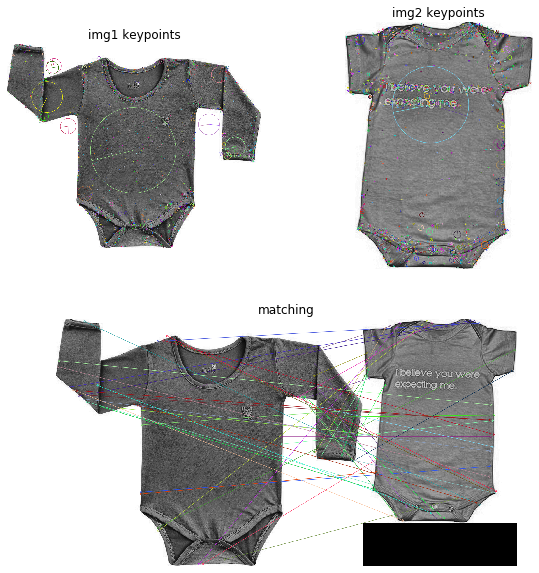

number of keypoints left image : 1685
number of keypoints right image : 1688
total number of matches : 758 


In [316]:
assess_sift_matching(img_1, img_2)

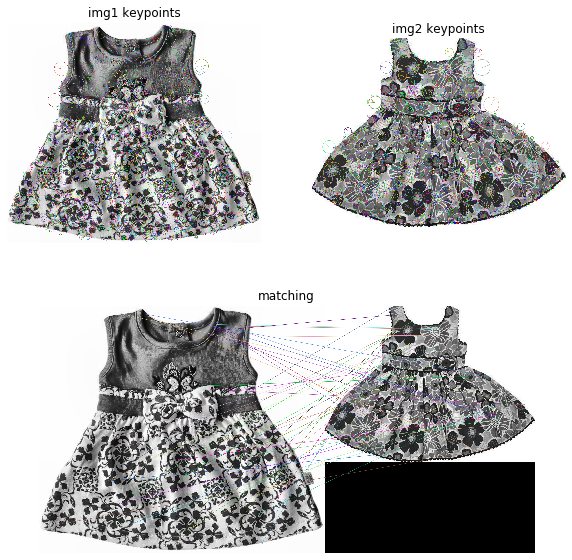

number of keypoints left image : 14505
number of keypoints right image : 7237
total number of matches : 4205 


In [317]:
assess_sift_matching(img_3, img_4)

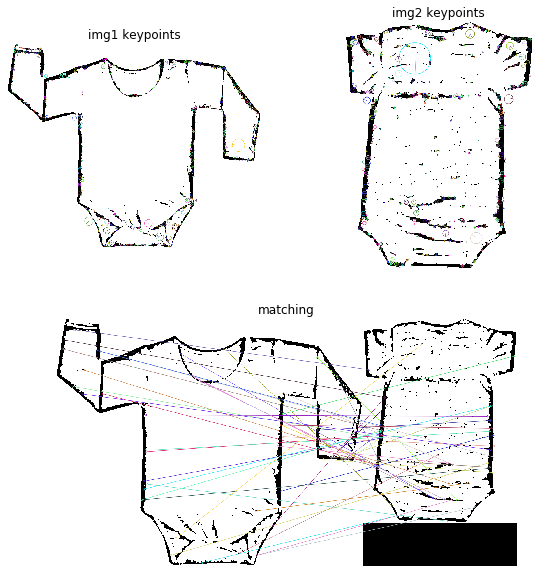

number of keypoints left image : 1012
number of keypoints right image : 834
total number of matches : 445 


In [310]:
assess_sift_matching(img_A, img_B)

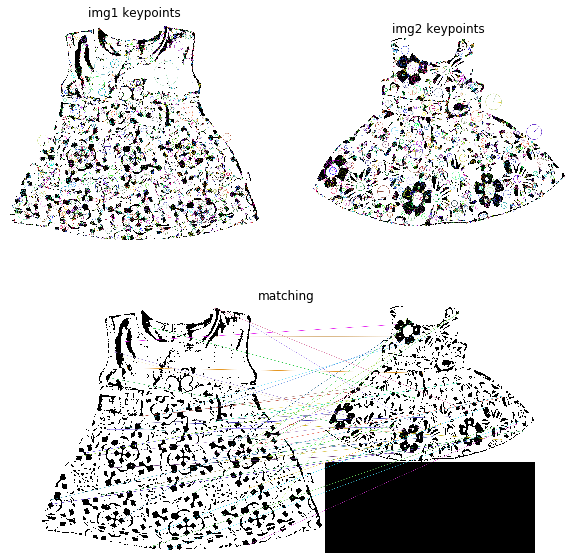

number of keypoints left image : 6552
number of keypoints right image : 3261
total number of matches : 2036 


In [311]:
assess_sift_matching(img_C, img_D)

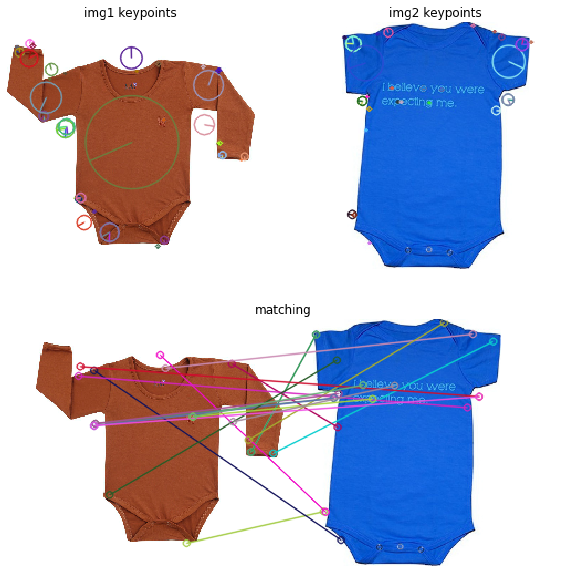

number of keypoints left image : 46
number of keypoints right image : 40
total number of matches : 19 


In [328]:
assess_sift_matching(img_x, img_y)

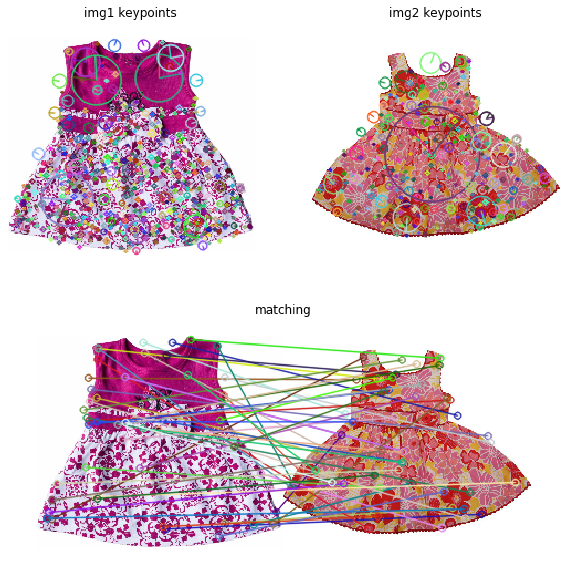

number of keypoints left image : 766
number of keypoints right image : 351
total number of matches : 230 


In [329]:
assess_sift_matching(img_z, img_t)

Autocontrast & Brightness exploration

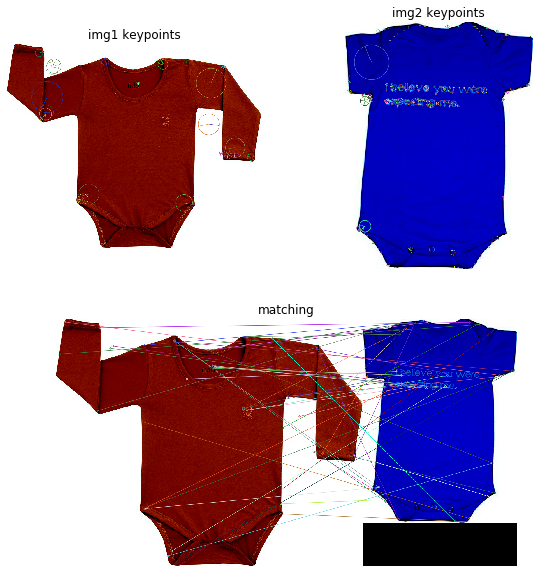

number of keypoints left image : 118
number of keypoints right image : 470
total number of matches : 82 


In [182]:
assess_sift_matching(img_1a, img_2a)

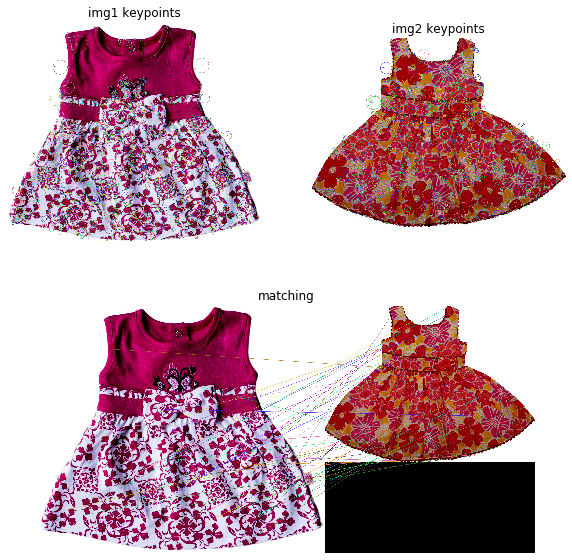

number of keypoints left image : 12047
number of keypoints right image : 6731
total number of matches : 3341 


In [183]:
assess_sift_matching(img_3a, img_4a)

We try to remedy impact of small size with our contrast and shape function

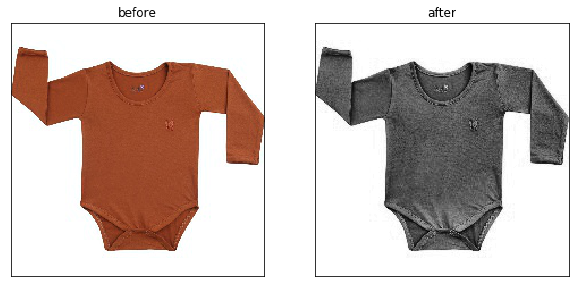

In [142]:
img_path = 'Data/Smaller_Images/2c8912b849cf73676d025aa99203b6d1.jpg'
img_1s = img_before_after(img_path, contrast_processor, convert=False)

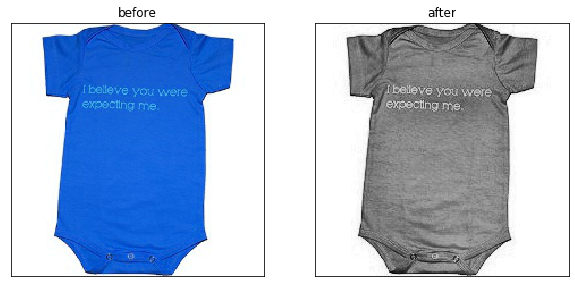

In [143]:
img_path = 'Data/Smaller_Images/46ca672fdfff8a1b3641642a9795344a.jpg'
img_2s = img_before_after(img_path, contrast_processor, convert=False)

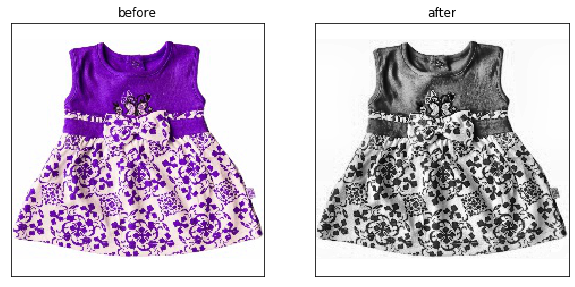

In [145]:
img_path = 'Data/Smaller_Images/32da1bbf4f523bc8a8735701ce4b7726.jpg'
img_3s = img_before_after(img_path, contrast_processor, convert=False)

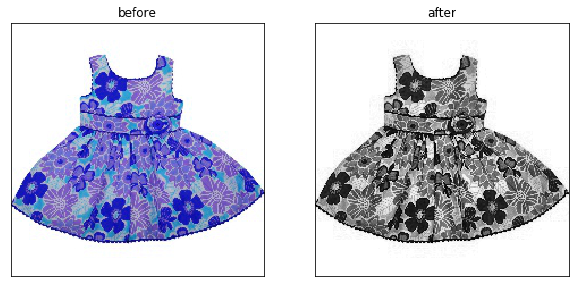

In [146]:
img_path = 'Data/Smaller_Images/84b2e623a4a4327b88f7fe197a09be31.jpg'
img_4s = img_before_after(img_path, contrast_processor, convert=False)

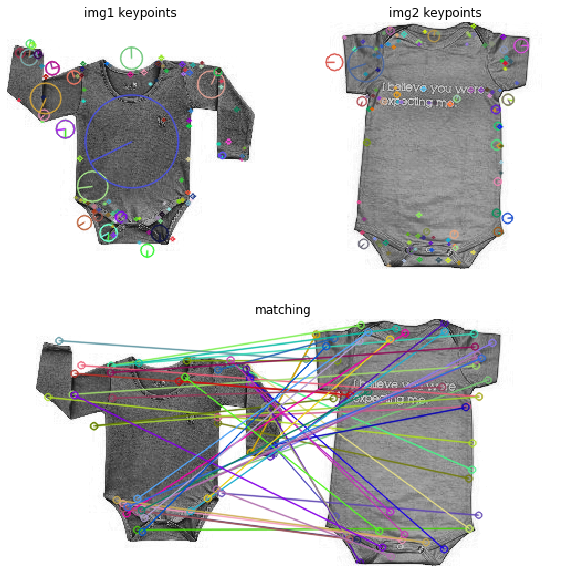

number of keypoints left image : 120
number of keypoints right image : 131
total number of matches : 62 


In [351]:
assess_sift_matching(img_1s, img_2s)

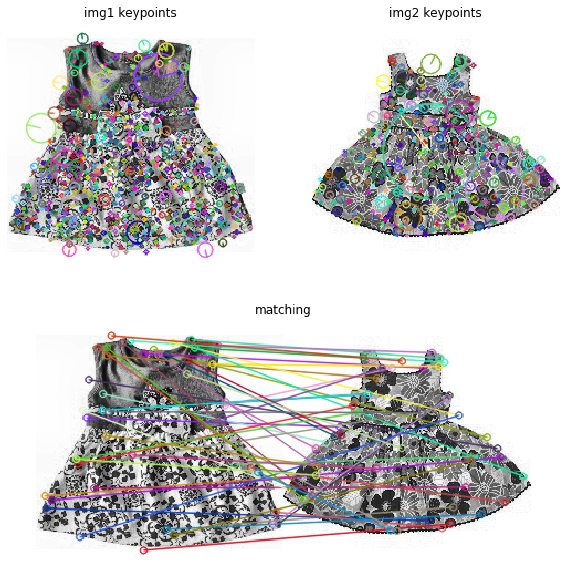

number of keypoints left image : 786
number of keypoints right image : 388
total number of matches : 254 


In [352]:
assess_sift_matching(img_3s, img_4s)

Unsurprisingly, smaller sizes prevent shape processor to do its work, while our contrastor seems improve descriptors & matching.

With keypoints exctractor restricted to 50.

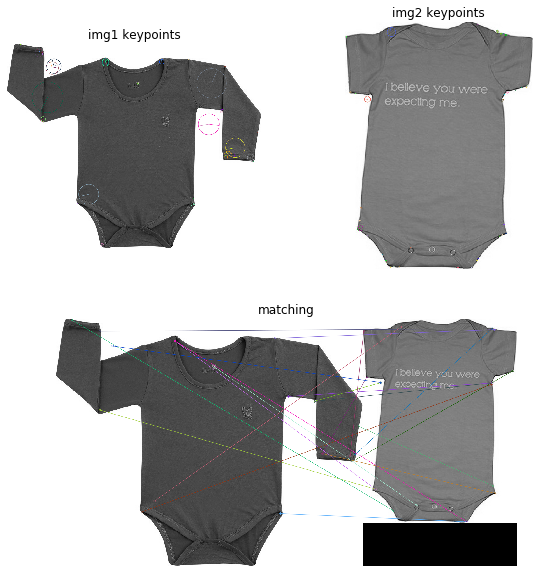

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 20 


In [186]:
# read two images
img1 = cv2.imread(
    'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg')
img2 = cv2.imread(
    'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

assess_sift_matching(img1, img2)

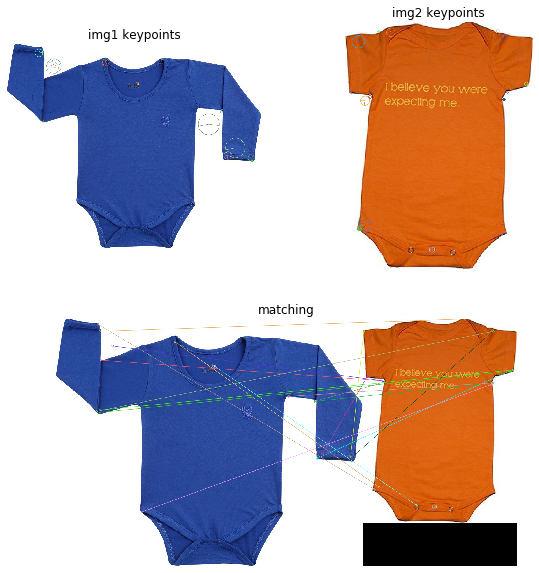

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 19 


In [187]:
# read two images
img1 = cv2.imread(
    'Data/Images/2c8912b849cf73676d025aa99203b6d1.jpg')
img2 = cv2.imread(
    'Data/Images/46ca672fdfff8a1b3641642a9795344a.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

assess_sift_matching(img1, img2)

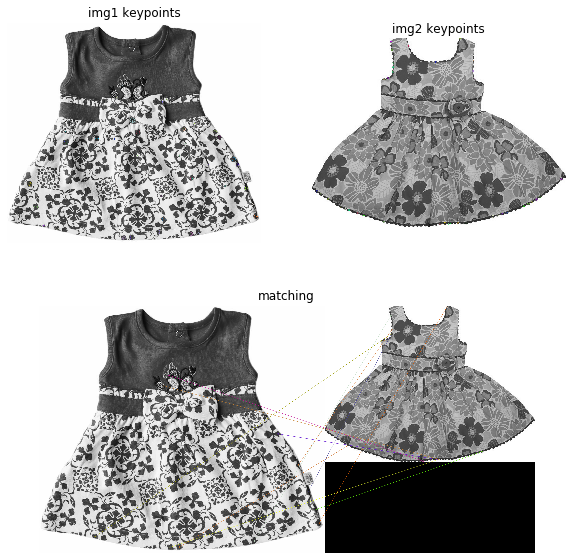

number of keypoints left image : 50
number of keypoints right image : 51
total number of matches : 11 


In [188]:
# read two images
img1 = cv2.imread(
    'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg')
img2 = cv2.imread(
    'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

assess_sift_matching(img1, img2)

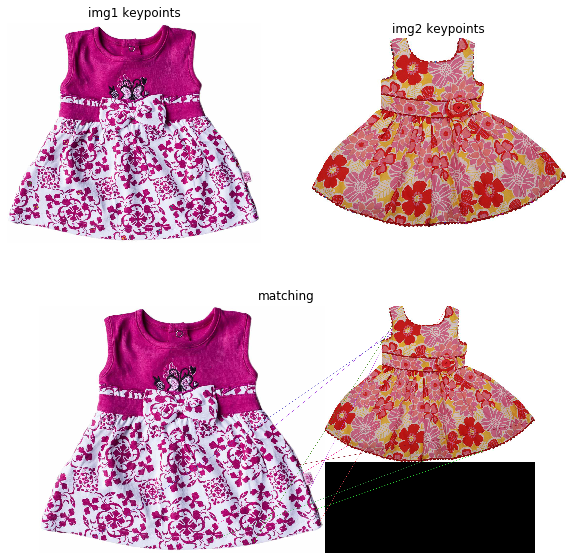

number of keypoints left image : 51
number of keypoints right image : 50
total number of matches : 9 


In [189]:
# read two images
img1 = cv2.imread(
    'Data/Images/32da1bbf4f523bc8a8735701ce4b7726.jpg')
img2 = cv2.imread(
    'Data/Images/84b2e623a4a4327b88f7fe197a09be31.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

assess_sift_matching(img1, img2)

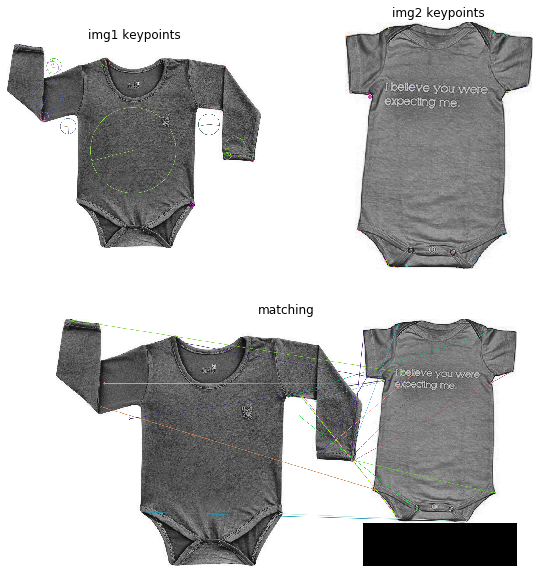

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 24 


In [190]:
assess_sift_matching(img_1, img_2)

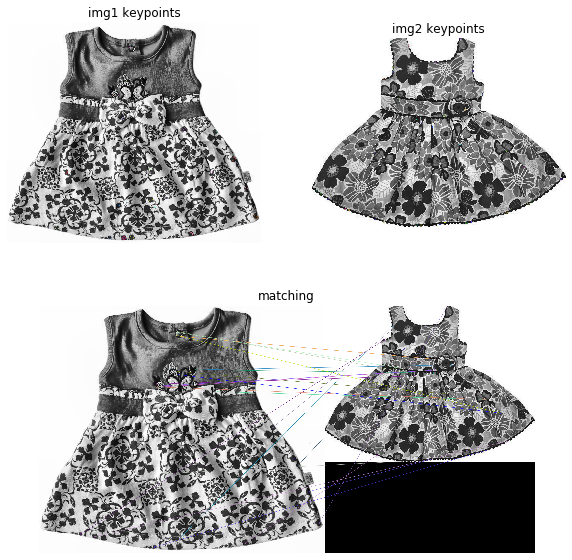

number of keypoints left image : 53
number of keypoints right image : 50
total number of matches : 25 


In [191]:
assess_sift_matching(img_3, img_4)

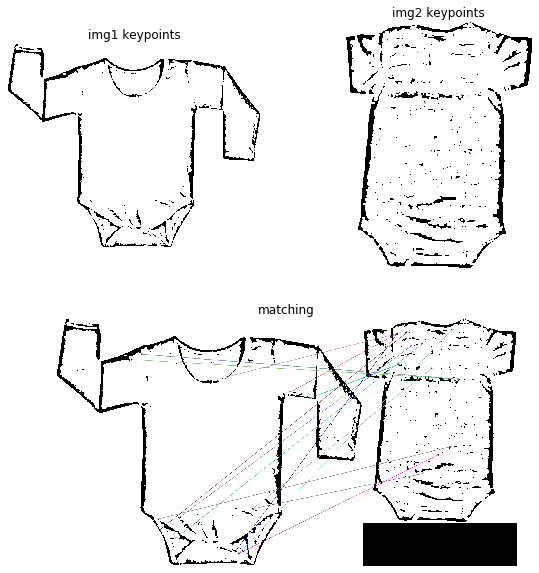

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 16 


In [192]:
assess_sift_matching(img_A, img_B)

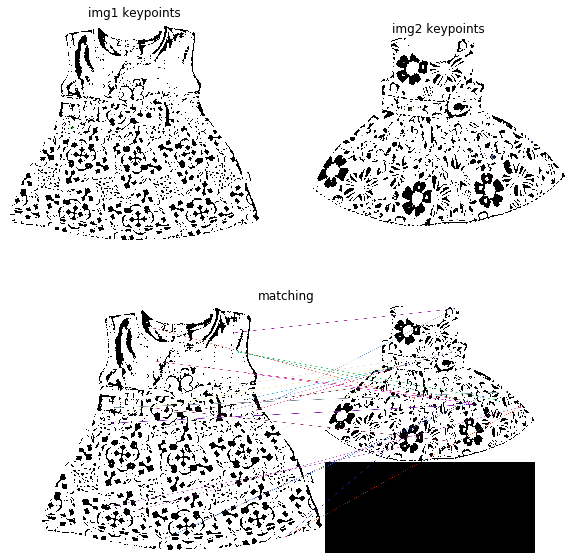

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 26 


In [193]:
assess_sift_matching(img_C, img_D)

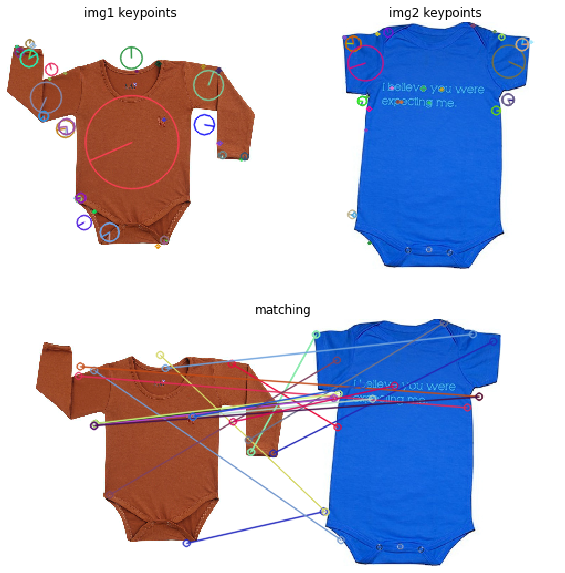

number of keypoints left image : 46
number of keypoints right image : 40
total number of matches : 19 


In [194]:
assess_sift_matching(img_x, img_y)

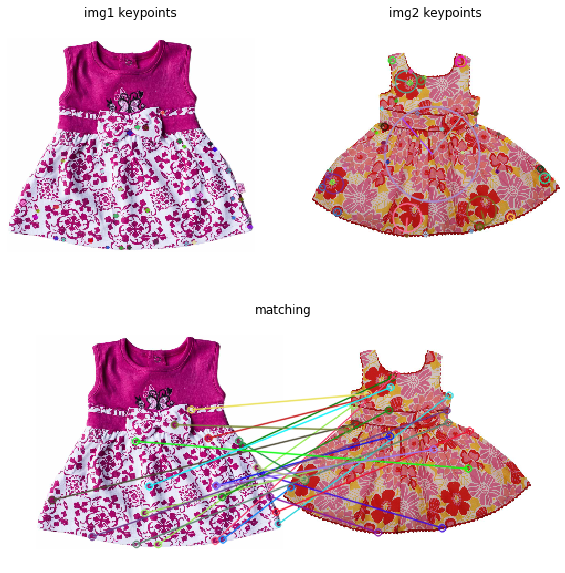

number of keypoints left image : 51
number of keypoints right image : 50
total number of matches : 22 


In [195]:
assess_sift_matching(img_z, img_t)

Autocontrast & Brightness exploration

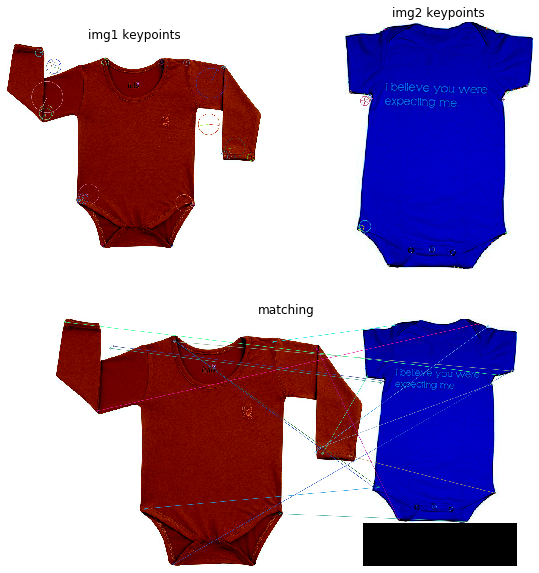

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 16 


In [196]:
assess_sift_matching(img_1a, img_2a)

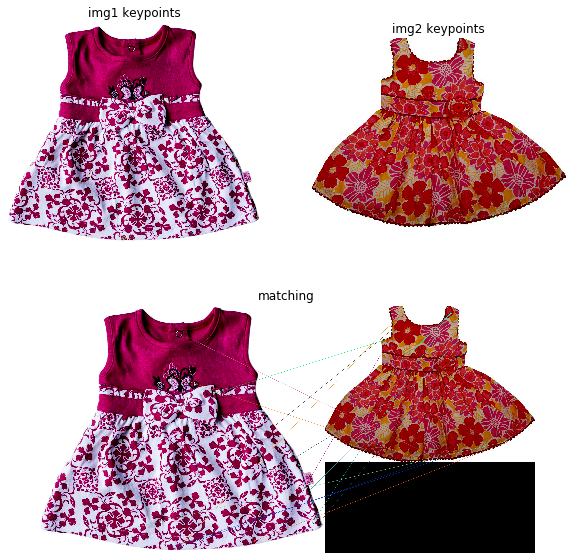

number of keypoints left image : 50
number of keypoints right image : 50
total number of matches : 15 


In [197]:
assess_sift_matching(img_3a, img_4a)

We try to remedy impact of small size with our contrast and shape function

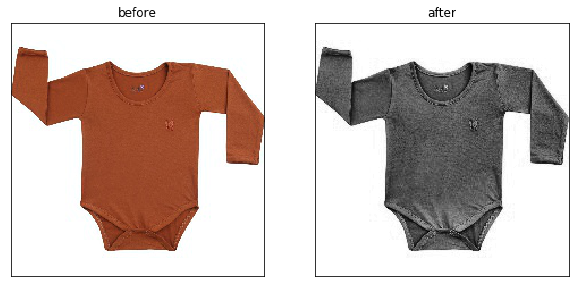

In [198]:
img_path = 'Data/Smaller_Images/2c8912b849cf73676d025aa99203b6d1.jpg'
img_1s = img_before_after(img_path, contrast_processor, convert=False)

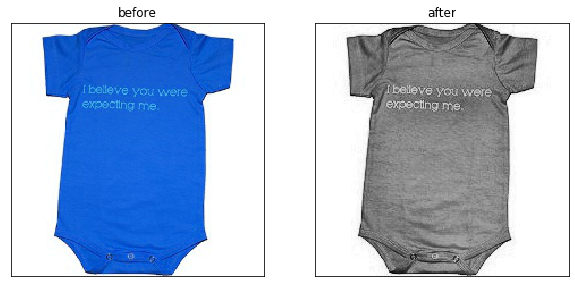

In [199]:
img_path = 'Data/Smaller_Images/46ca672fdfff8a1b3641642a9795344a.jpg'
img_2s = img_before_after(img_path, contrast_processor, convert=False)

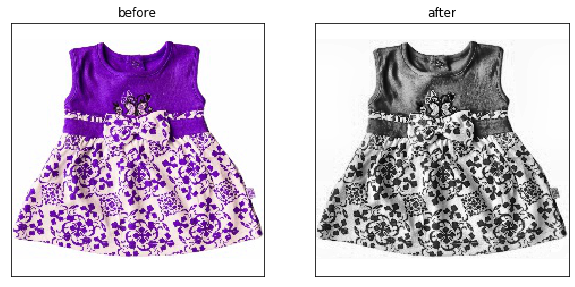

In [200]:
img_path = 'Data/Smaller_Images/32da1bbf4f523bc8a8735701ce4b7726.jpg'
img_3s = img_before_after(img_path, contrast_processor, convert=False)

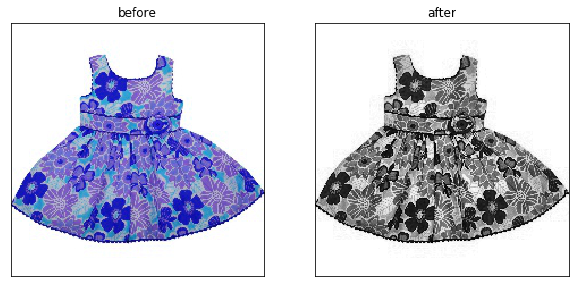

In [201]:
img_path = 'Data/Smaller_Images/84b2e623a4a4327b88f7fe197a09be31.jpg'
img_4s = img_before_after(img_path, contrast_processor, convert=False)

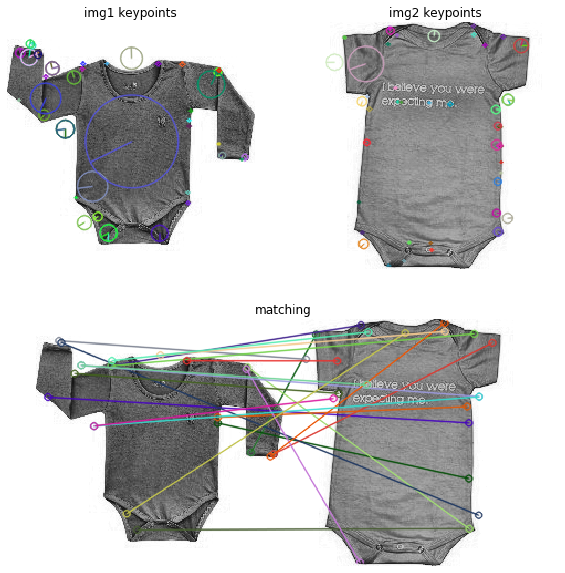

number of keypoints left image : 50
number of keypoints right image : 51
total number of matches : 23 


In [202]:
assess_sift_matching(img_1s, img_2s)

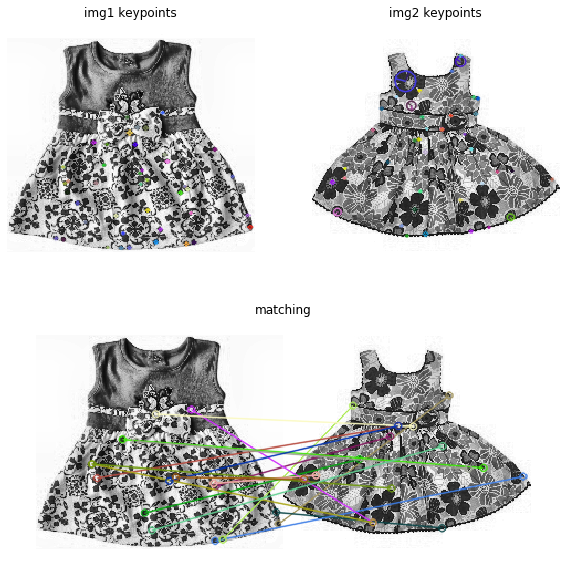

number of keypoints left image : 50
number of keypoints right image : 51
total number of matches : 18 


In [203]:
assess_sift_matching(img_3s, img_4s)

In [356]:
'''
# input and ouput path
input_path = 'Data/Smaller_Images'
output_path = 'Data/SContrast_Images'
# apply alternate contrast method to smaller images
organize_2_cat_folders(contrast_processor, input_path, output_path, dataset=data)
'''